In [2]:
# Import Dependencies
import cv2
import numpy as np 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt 

import warnings
warnings.filterwarnings("ignore")

In [3]:
import tensorflow as tf
from PIL import Image
import tensorflow.keras.backend as K
from tensorflow.keras.preprocessing import image
from tensorflow.keras import models
from tensorflow.keras.models import load_model
from skimage.io import imread

K.clear_session()

In [4]:
img = plt.imread('C:\\Users\\user\\Downloads\\fyp\\Dataset\\dataset\\Dataset\\train\\burger\\004.jpg')
dims = np.shape(img)
dims

(500, 500, 3)

In [5]:
matrix = np.reshape(img , (dims[0] * dims[1] , dims[2]))
print(np.shape(matrix))

(250000, 3)


Image Shape:- (500, 500)
Color Channels:- 3
Min Color Depth : 0, Max Color Depth 255


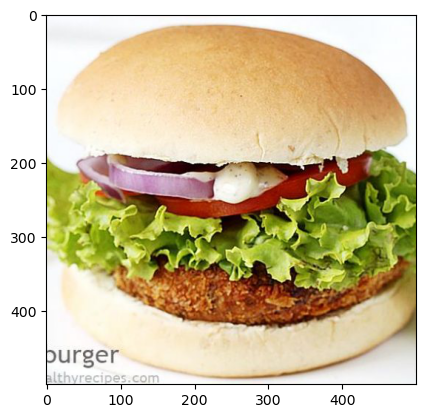

In [6]:
plt.imshow(img)
print("Image Shape:-" , dims[:2])
print("Color Channels:-", dims[2])
print("Min Color Depth : {}, Max Color Depth {}".format(np.min(img) , np.max(img)))

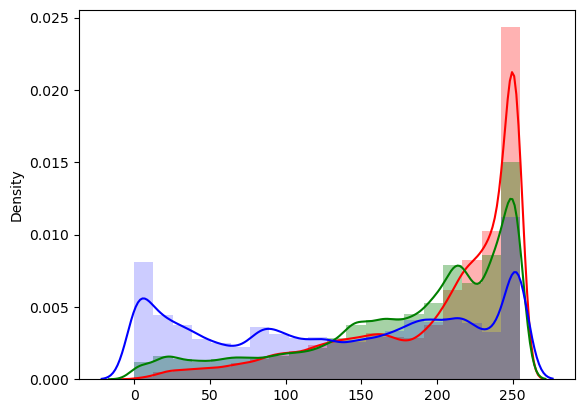

In [7]:
sns.distplot(matrix[:,0], bins=20,color="red",hist_kws=dict(alpha=0.3))
sns.distplot(matrix[:,1], bins=20,color="green",hist_kws=dict(alpha=0.35))
sns.distplot(matrix[:,2], bins=20,color="blue",hist_kws=dict(alpha=0.2))
plt.show()

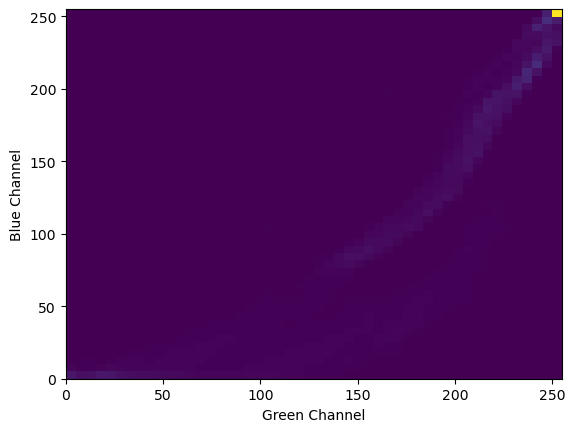

In [8]:
_ = plt.hist2d(matrix[:,1] , matrix[:,2] , bins = (50,50))
plt.xlabel("Green Channel")
plt.ylabel("Blue Channel")
plt.show()

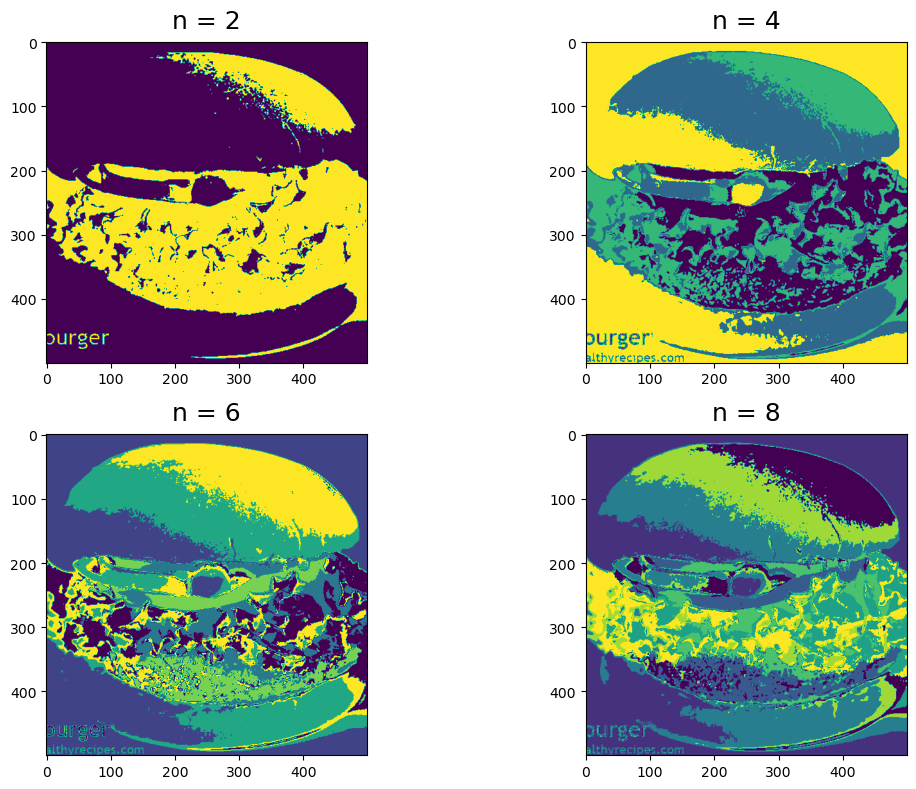

In [9]:
from sklearn import cluster
n_vals = [2,4,6,8]
plt.figure(1 , figsize = (12 , 8))

for subplot , n in enumerate(n_vals):
    kmeans = cluster.KMeans(n)
    clustered = kmeans.fit_predict(matrix)
    dims = np.shape(img)
    clustered_img = np.reshape(clustered , (dims[0] , dims[1]))
    plt.subplot(2,2, subplot+1)
    plt.title("n = {}".format(n) , pad = 10 , size = 18)
    plt.imshow(clustered_img)

plt.tight_layout()


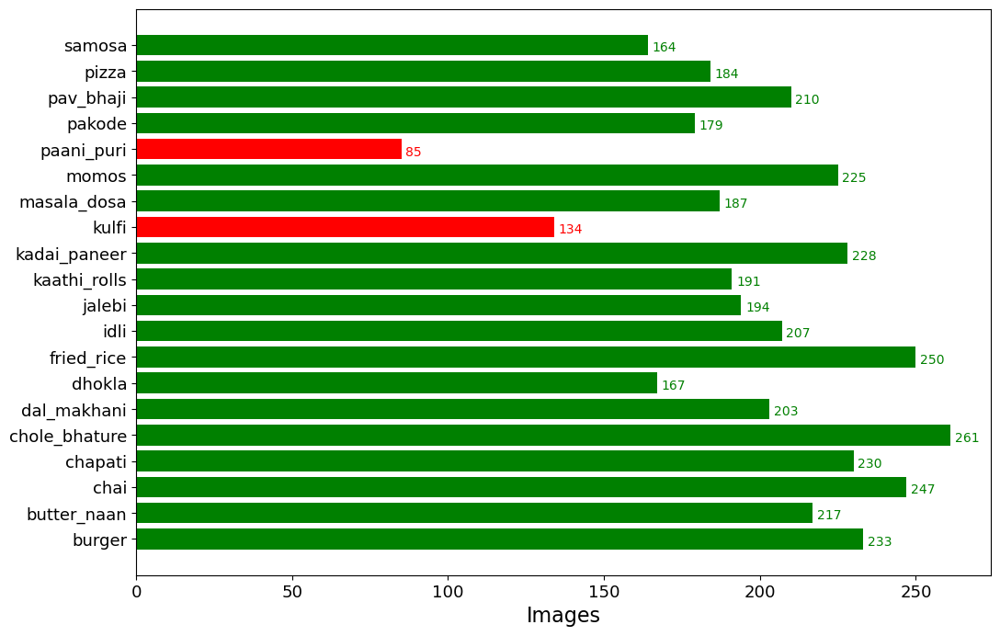

In [9]:
import os

train = 'D:\\Dataset\\dataset\\Dataset\\train'

data = dict()

for i in os.listdir(train):
    sub_dir = os.path.join(train , i)
    count = len(os.listdir(sub_dir))
    data[i] = count

keys = data.keys()
values = data.values()

colors = ["red" if x<= 150 else "green" for x in values]

fig , ax = plt.subplots(figsize = (12,8))
y_pos = np.arange(len(values))
plt.barh(y_pos , values , align = "center" , color=colors)
for i , v in enumerate(values):
    ax.text(v+1.4 , i-0.25 , str(v), color = colors[i])
ax.set_yticks(y_pos)
ax.set_yticklabels(keys)
ax.set_xlabel('Images',fontsize=16)
plt.xticks(color='black',fontsize=13)
plt.yticks(fontsize=13)
plt.show()  

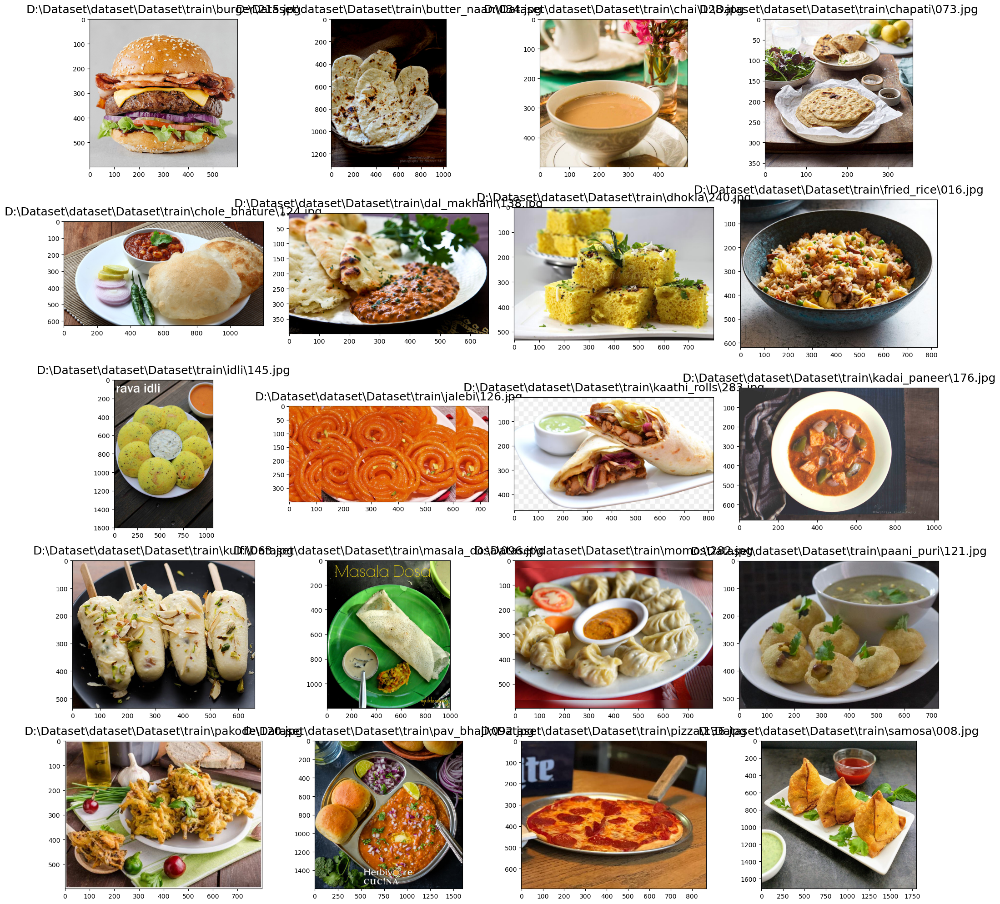

In [10]:
import os
import numpy as np
import matplotlib.pyplot as plt

train_folder = "D:\\Dataset\\dataset\\Dataset\\train"
images = []

for food_folder in sorted(os.listdir(train_folder)):
    food_items = os.listdir(os.path.join(train_folder, food_folder))
    if food_items:
        food_selected = np.random.choice(food_items)
        image_path = os.path.join(train_folder, food_folder, food_selected)
        if os.path.exists(image_path):
            images.append(image_path)
# Adjust figure size based on the number of images
num_images = len(images)
cols = 4  # Adjust number of columns as needed
rows = (num_images + cols - 1) // cols  # Calculate number of rows

fig, axes = plt.subplots(rows, cols, figsize=(20, 20))  # Adjust figsize as needed
axes = axes.flatten()

if images:  # Check if images list is not empty
    for subplot, image_ in enumerate(images):
        if subplot >= len(axes):  # Handle case where number of images exceeds plot grid
            break
        try:
            category = image_.split("/")[0]
            imgs = plt.imread(image_)
            axes[subplot].imshow(imgs)
            axes[subplot].set_title(category, pad=10, size=18)
        except FileNotFoundError:
            print(f"Error loading image: {image_}")
        except IndexError:
            print(f"Invalid image path: {image_}")

plt.tight_layout()
plt.show()


In [11]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

n_classes = 20
batch_size = 32
img_width , img_height = 299 , 299

train_data_dir = 'D:\\Dataset\\dataset\\Dataset\\train'

# Data Augmentation
train_datagen = ImageDataGenerator(rescale = 1./255,
                                  shear_range = 0.2,
                                  zoom_range = 0.2,
                                  horizontal_flip = True)


val_data_dir = 'D:\\Dataset\\dataset\\Dataset\\val'
val_datagen = ImageDataGenerator(rescale=1. / 255)

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical')


val_generator = val_datagen.flow_from_directory(
    val_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical')

Found 3996 images belonging to 20 classes.
Found 1250 images belonging to 20 classes.


In [12]:
class_map = train_generator.class_indices
class_map

{'burger': 0,
 'butter_naan': 1,
 'chai': 2,
 'chapati': 3,
 'chole_bhature': 4,
 'dal_makhani': 5,
 'dhokla': 6,
 'fried_rice': 7,
 'idli': 8,
 'jalebi': 9,
 'kaathi_rolls': 10,
 'kadai_paneer': 11,
 'kulfi': 12,
 'masala_dosa': 13,
 'momos': 14,
 'paani_puri': 15,
 'pakode': 16,
 'pav_bhaji': 17,
 'pizza': 18,
 'samosa': 19}

In [21]:
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras import regularizers
from tensorflow.keras.regularizers import l2
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger

nb_train_samples = 3583
nb_valid_samples = 1089

image_size = [299 , 299]

inception = InceptionV3(input_shape = image_size + [3] , weights = "imagenet" , include_top = False)
x = inception.output
x = GlobalAveragePooling2D()(x)
x = Dense(128 , activation = "relu")(x)
x = Dropout(0.2)(x)

predictions = Dense(n_classes , kernel_regularizer = l2(0.005) , activation = "softmax")(x)

model = Model(inputs = inception.input , outputs = predictions)
model.compile(
    optimizer=SGD(learning_rate=0.0001, momentum=0.9),  # Use learning_rate instead of lr
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

# Rest of the code remains the same
# Updated ModelCheckpoint callback
checkpoints = ModelCheckpoint(filepath="v1_inceptionV3.keras", verbose=1, save_best_only=True)
csv_logger = CSVLogger("history_v1_inceptionV3.log")

# Training the model
history = model.fit(
    train_generator,
    steps_per_epoch=nb_train_samples // batch_size,
    validation_data=val_generator,
    validation_steps=nb_valid_samples // batch_size,
    epochs=20,
    verbose=1,
    callbacks=[csv_logger, checkpoints]
)


Epoch 1/20
111/111 ━━━━━━━━━━━━━━━━━━━━ 0s 20s/step - accuracy: 0.0712 - loss: 3.2121 
Epoch 1: val_loss improved from inf to 3.00642, saving model to v1_inceptionV3.keras
111/111 ━━━━━━━━━━━━━━━━━━━━ 2499s 22s/step - accuracy: 0.0714 - loss: 3.2115 - val_accuracy: 0.1461 - val_loss: 3.0064
Epoch 2/20
 14/111 ━━━━━━━━━━━━━━━━━━━━ 30:01 19s/step - accuracy: 0.1516 - loss: 3.0400
Epoch 2: val_loss improved from 3.00642 to 2.97673, saving model to v1_inceptionV3.keras
111/111 ━━━━━━━━━━━━━━━━━━━━ 291s 2s/step - accuracy: 0.1674 - loss: 3.0210 - val_accuracy: 0.1605 - val_loss: 2.9767
Epoch 3/20
111/111 ━━━━━━━━━━━━━━━━━━━━ 0s 21s/step - accuracy: 0.1934 - loss: 2.9335 
Epoch 3: val_loss improved from 2.97673 to 2.72046, saving model to v1_inceptionV3.keras
111/111 ━━━━━━━━━━━━━━━━━━━━ 2534s 23s/step - accuracy: 0.1938 - loss: 2.9331 - val_accuracy: 0.3778 - val_loss: 2.7205
Epoch 4/20
 14/111 ━━━━━━━━━━━━━━━━━━━━ 30:23 19s/step - accuracy: 0.2951 - loss: 2.7611
Epoch 4: val_loss did not i

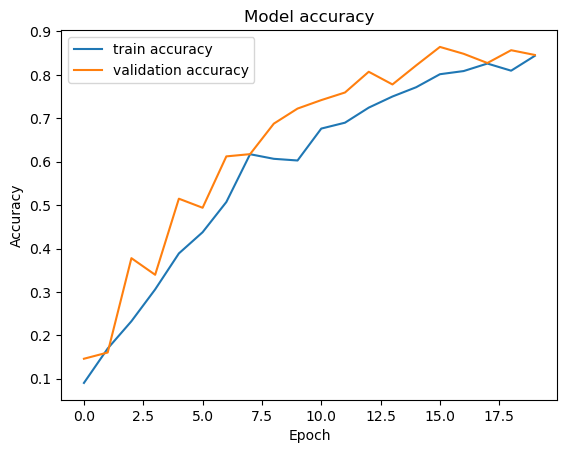

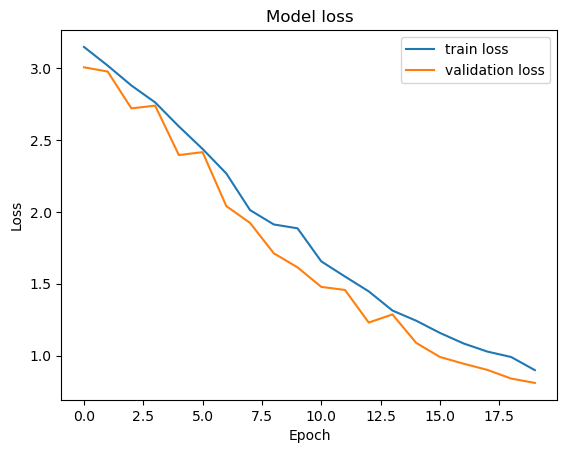

In [23]:
## Accuracy and Loss Curves

def plot_accuracy(history):
    
    plt.plot(history.history['accuracy'],label='train accuracy')
    plt.plot(history.history['val_accuracy'],label='validation accuracy')
    plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(loc='best')
    plt.savefig('Accuracy_v1_InceptionV3')
    plt.show()
    
def plot_loss(history):
    
    plt.plot(history.history['loss'],label="train loss")
    plt.plot(history.history['val_loss'],label="validation loss")
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='best')
    plt.savefig('Loss_v1_InceptionV3')
    plt.show()
    
plot_accuracy(history)
plot_loss(history)

In [25]:
# load the model
K.clear_session()
model_path = "D:\\Dataset\\dataset\\Dataset\\model_inceptionV3.h5"
print("loading the model..")
model = load_model(model_path)
print("Done!")

loading the model..


Done!


In [27]:
test_data_dir = 'D:\\Dataset\\test'

test_datagen = ImageDataGenerator(rescale = 1./255)

test_generator = test_datagen.flow_from_directory(test_data_dir,
                                                 target_size = (img_height , img_width),
                                                 batch_size = batch_size,
                                                 class_mode = "categorical")

Found 585 images belonging to 20 classes.


In [29]:
scores = model.evaluate(test_generator)
print("Test Accuracy : {:.3f}".format(scores[1]))


19/19 ━━━━━━━━━━━━━━━━━━━━ 84s 4s/step - accuracy: 0.7846 - loss: 1.1637
Test Accuracy : 0.774


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


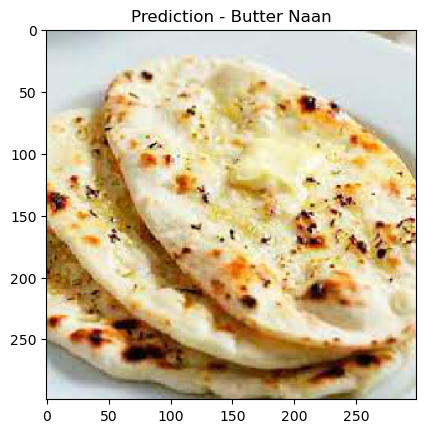

In [31]:
# Function to predict single image or predict all images from a directory
category={
    0: ['burger','Burger'], 1: ['butter_naan','Butter Naan'], 2: ['chai','Chai'],
    3: ['chapati','Chapati'], 4: ['chole_bhature','Chole Bhature'], 5: ['dal_makhani','Dal Makhani'],
    6: ['dhokla','Dhokla'], 7: ['fried_rice','Fried Rice'], 8: ['idli','Idli'], 9: ['jalegi','Jalebi'],
    10: ['kathi_rolls','Kaathi Rolls'], 11: ['kadai_paneer','Kadai Paneer'], 12: ['kulfi','Kulfi'],
    13: ['masala_dosa','Masala Dosa'], 14: ['momos','Momos'], 15: ['paani_puri','Paani Puri'],
    16: ['pakode','Pakode'], 17: ['pav_bhaji','Pav Bhaji'], 18: ['pizza','Pizza'], 19: ['samosa','Samosa']
}

def predict_image(filename , model):
    img_ = image.load_img(filename , target_size = (299,299))
    img_array = image.img_to_array(img_)
    img_processed = np.expand_dims(img_array , axis = 0)
    img_processed /= 255.
    
    prediction = model.predict(img_processed)
    index = np.argmax(prediction)
    
    plt.title("Prediction - {}".format(category[index][1]))
    plt.imshow(img_array)
    
predict_image('D:\\Dataset\\test\\butter_naan\\download (13).jpg' , model)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

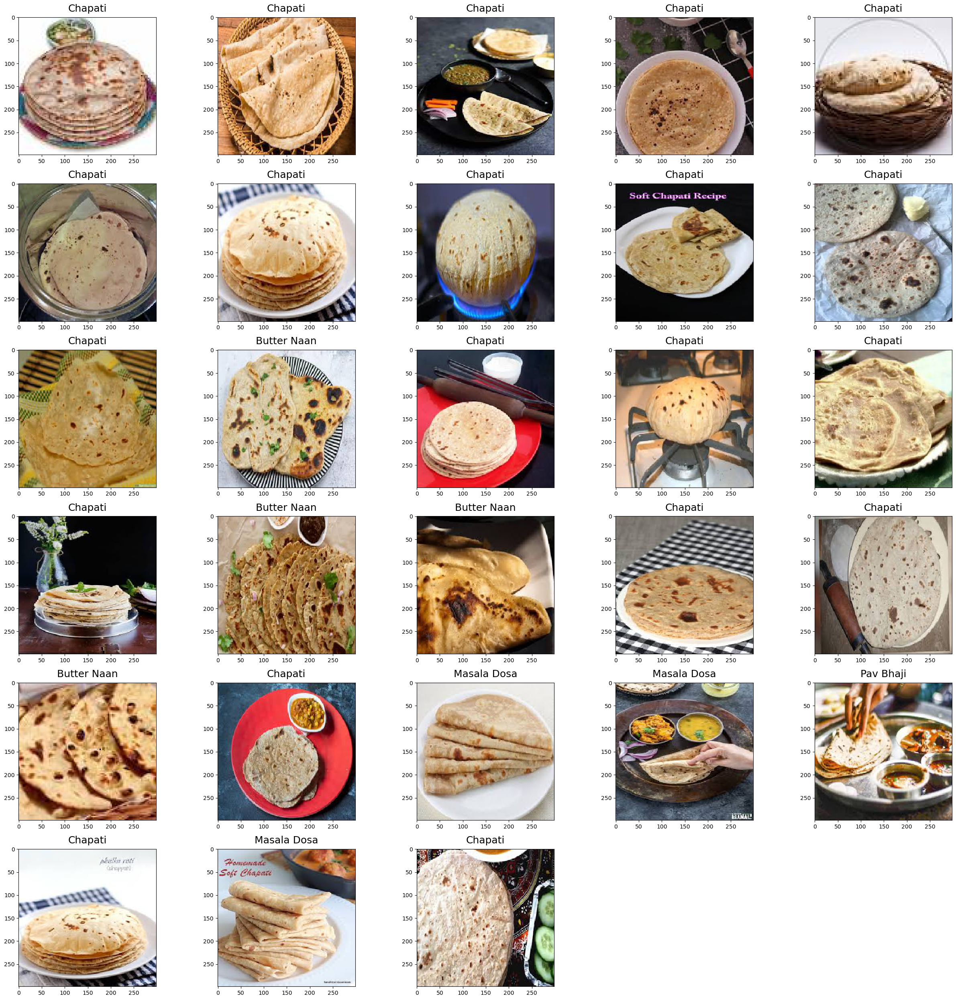

In [33]:
def predict_images(filenames , model):
    cols = 5
    pos = 0
    images = []
    total_images = len(os.listdir(filenames))
    rows = total_images // cols + 1
    
    true = filenames.split("/")[-1]
    fig = plt.figure(1 , figsize = (25,25))
    
    for i in sorted(os.listdir(filenames)):
        images.append(os.path.join(filenames , i))
        
    for subplot , imgs in enumerate(images):
        img_ = image.load_img(imgs , target_size = (299 , 299))
        img_array = image.img_to_array(img_)
        img_processed = np.expand_dims(img_array , axis = 0)
        img_processed /= 255.
        
        prediction = model.predict(img_processed)
        index = np.argmax(prediction)
        
        preds = category.get(index)[0]
        if preds == true:
            pos+=1
            
        fig = plt.subplot(rows , cols , subplot+1)
        fig.set_title(category.get(index)[1] , pad = 10 , size = 18)
        plt.imshow(img_array)
        
    acc = pos/total_images
    print("Accuracy of Test : {:.2f} ({pos} / {total})".format(acc , pos = pos , total = total_images))
    plt.tight_layout()
    
predict_images("D:\\Dataset\\test\\chapati",model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

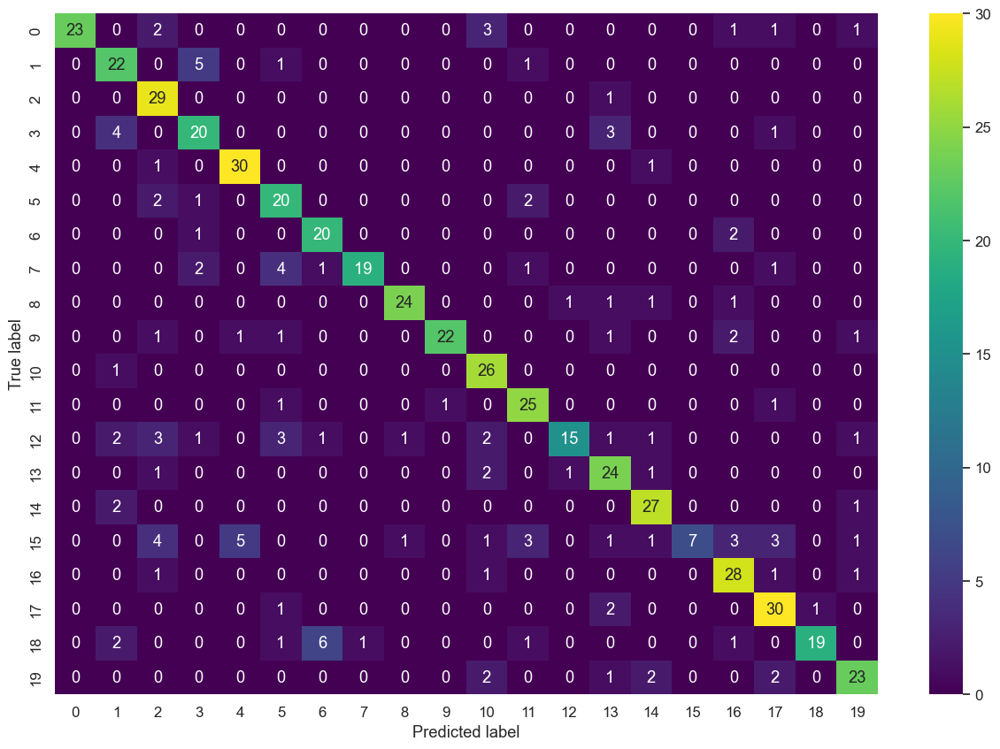

In [43]:
from sklearn.metrics import confusion_matrix
import itertools
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image

img_width, img_height = 299, 299

def labels_confusion_matrix():
    folder_path = "D:\\Dataset\\test"
    
    # Create a mapping dictionary with folder names
    mapping = {}
    for i, j in enumerate(sorted(os.listdir(folder_path))):
        mapping[j] = i
    
    files = []
    real = []
    predicted = []

    for i in os.listdir(folder_path):
        # Extract folder name from path
        true = i.split(os.sep)[-1]
        
        if true not in mapping:
            print(f"Warning: '{true}' not found in mapping.")
            continue  # Skip folders not in mapping
        
        true_label = mapping[true]
        
        for j in os.listdir(os.path.join(folder_path, i)):
            img_path = os.path.join(folder_path, i, j)
            img_ = image.load_img(img_path, target_size=(img_height, img_width))
            img_array = image.img_to_array(img_)
            img_processed = np.expand_dims(img_array, axis=0)
            img_processed /= 255.0
            
            prediction = model.predict(img_processed)
            index = np.argmax(prediction)

            predicted.append(index)
            real.append(true_label)
            
    return real, predicted

def print_confusion_matrix(real, predicted):
    cmap = "viridis"
    cm_plot_labels = [i for i in range(20)]

    cm = confusion_matrix(y_true=real, y_pred=predicted)
    df_cm = pd.DataFrame(cm, cm_plot_labels, cm_plot_labels)
    sns.set(font_scale=1.1)  # for label size
    plt.figure(figsize=(15, 10))
    s = sns.heatmap(df_cm, annot=True, cmap=cmap)  # font size
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.savefig('confusion_matrix.png')
    plt.show()

y_true, y_pred = labels_confusion_matrix()
print_confusion_matrix(y_true, y_pred)


In [46]:
# Save the trained model
model.save('v1_inceptionV3.keras')


In [4]:
from tensorflow.keras.models import load_model

# Load the saved model
model = load_model('v1_inceptionV3.keras')


C:\Users\salah\AppData\Local\anaconda3\Lib\site-packages\keras\src\saving\saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'SGD', because it has 194 variables whereas the saved optimizer has 2 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [8]:
from tensorflow.keras.preprocessing import image
import numpy as np

# Example: Predicting a single image
img_path = 'C:\\Users\\salah\\Downloads\\chapati.jpg'  # Replace with the path to the image you want to predict
img_width, img_height = 299, 299

# Load and preprocess the image
img_ = image.load_img(img_path, target_size=(img_height, img_width))
img_array = image.img_to_array(img_)
img_processed = np.expand_dims(img_array, axis=0)
img_processed /= 255.0

# Make a prediction
prediction = model.predict(img_processed)
predicted_class_index = np.argmax(prediction)

# Map the predicted index to class label if you have a class mapping dictionary
class_mapping = {0: 'burger', 1: 'butter_naan', 2: 'chai', 3: 'chapati', 4: 'chole_bhature', 
                 5: 'dal_makhani', 6: 'dhokla', 7: 'fried_rice', 8: 'idli', 9: 'jalebi', 
                 10: 'kaathi_rolls', 11: 'kadai_paneer', 12: 'kulfi', 13: 'masala_dosa', 
                 14: 'momos', 15: 'paani_puri', 16: 'pakode', 17: 'pav_bhaji', 18: 'pizza', 
                 19: 'samosa'}

predicted_class_label = class_mapping[predicted_class_index]
print(f"Predicted Class: {predicted_class_label}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Predicted Class: chapati


In [32]:
from dotenv import load_dotenv
import os
import google.generativeai as genai
from PIL import Image
import numpy as np
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image

# Load environment variables
load_dotenv()

# Configure Gemini API
genai.configure(api_key=os.getenv("GOOGLE_API_KEY"))

# Initialize Gemini model
model = genai.GenerativeModel('gemini-pro')

# Load the trained Keras model
keras_model = load_model('v1_inceptionV3.keras')

# Class mapping for predictions
class_mapping = {0: 'burger', 1: 'butter_naan', 2: 'chai', 3: 'chapati', 4: 'chole_bhature', 
                 5: 'dal_makhani', 6: 'dhokla', 7: 'fried_rice', 8: 'idli', 9: 'jalebi', 
                 10: 'kaathi_rolls', 11: 'kadai_paneer', 12: 'kulfi', 13: 'masala_dosa', 
                 14: 'momos', 15: 'paani_puri', 16: 'pakode', 17: 'pav_bhaji', 18: 'pizza', 
                 19: 'samosa'}

def predict_food(img_path):
    img_width, img_height = 299, 299
    img_ = image.load_img(img_path, target_size=(img_height, img_width))
    img_array = image.img_to_array(img_)
    img_processed = np.expand_dims(img_array, axis=0)
    img_processed /= 255.0
    
    prediction = keras_model.predict(img_processed)
    predicted_class_index = np.argmax(prediction)
    predicted_class_label = class_mapping[predicted_class_index]
    
    return predicted_class_label

def get_gemini_response(food_item):
    prompt = f"Generate a recipe, title, and ingredients for {food_item}."
    response = model.generate_content(prompt)
    return response.text

if __name__ == "__main__":
    img_path = input("Enter the path to the image file: ").strip()
    
    try:
        # Predict the food item
        predicted_food = predict_food(img_path)
        print(f"Identified Food Item: {predicted_food}")

        # Get Gemini API response
        response = get_gemini_response(predicted_food)
        print("Recipe and Ingredients:")
        print(response)
    except Exception as e:
        print(f"An error occurred: {e}")


Enter the path to the image file:  C:\Users\salah\Downloads\Momo_nepal.jpg


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
Identified Food Item: momos
Recipe and Ingredients:
**Title:** Steamed Momos: A Delightful Himalayan Treat

**Ingredients:**

**For the Dough:**
* 2 cups all-purpose flour
* 1/2 cup water
* 1/4 teaspoon salt

**For the Filling:**
* 1 pound ground meat (chicken, pork, or lamb)
* 1 onion, finely chopped
* 1 bell pepper, finely chopped
* 1 carrot, finely chopped
* 1/2 cup finely chopped cilantro
* 1 tablespoon ginger-garlic paste
* 1 teaspoon ground cumin
* 1/2 teaspoon coriander powder
* 1/4 teaspoon turmeric powder
* 1/4 teaspoon garam masala
* Salt and pepper to taste

**For the Sauce:**
* 1/2 cup tomato puree
* 1/4 cup chopped onion
* 1/4 cup chopped bell pepper
* 1 tablespoon soy sauce
* 1 tablespoon vinegar
* 1 teaspoon honey
* 1/4 teaspoon red chili powder (optional)
* Salt and pepper to taste

**Instructions:**

**For the Dough:**
1. In a large bowl, combine the flour, water, and salt.
2. Knead until the dough forms a smooth and elastic ball.
3.

In [20]:
pip install tensorflow google-generativeai python-dotenv

Note: you may need to restart the kernel to use updated packages.


Enter the path to the image file:  C:\Users\salah\Downloads\burge.jpg


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
Identified Food Item: burger
Image saved as 'image.png'.
Recipe and Ingredients:
**Title:** The Ultimate Cheeseburger

**Ingredients:**

**For the Patties:**
* 1 pound ground beef (80/20)
* 1 teaspoon salt
* 1/2 teaspoon black pepper
* 1/4 teaspoon garlic powder
* 1/4 teaspoon onion powder

**For the Toppings:**
* 4 slices American cheese
* 4 slices bacon
* 4 lettuce leaves
* 4 tomato slices
* 4 onion slices
* 4 pickle slices
* Mayonnaise
* Ketchup
* Mustard (optional)

**Instructions:**

**Make the Patties:**
1. In a large bowl, combine the ground beef, salt, pepper, garlic powder, and onion powder. Mix well until combined.
2. Divide the beef mixture into four equal portions and form into patties. Make a small indentation in the center of each patty to prevent them from puffing up while cooking.

**Cook the Patties:**
1. Preheat a grill or grill pan over medium-high heat.
2. Grill the patties for 4-5 minutes per side, or until cooked to your desired

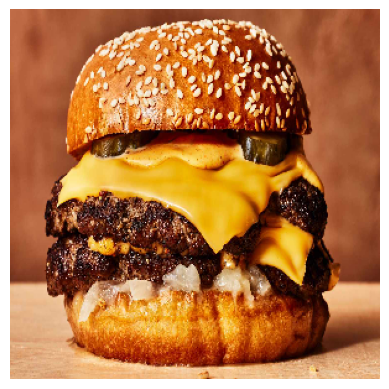

In [1]:
from dotenv import load_dotenv
import os
import google.generativeai as genai
from PIL import Image
import numpy as np
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
import warnings

# Suppress specific warnings
warnings.filterwarnings('ignore', category=UserWarning, module='keras')

# Load environment variables
load_dotenv()

# Configure Gemini API
genai.configure(api_key=os.getenv("GOOGLE_API_KEY"))

# Initialize Gemini model
model = genai.GenerativeModel('gemini-pro')

# Load the trained Keras model
keras_model = load_model('v1_inceptionV3.keras')

# Class mapping for predictions
class_mapping = {0: 'burger', 1: 'butter_naan', 2: 'chai', 3: 'chapati', 4: 'chole_bhature', 
                 5: 'dal_makhani', 6: 'dhokla', 7: 'fried_rice', 8: 'idli', 9: 'jalebi', 
                 10: 'kaathi_rolls', 11: 'kadai_paneer', 12: 'kulfi', 13: 'masala_dosa', 
                 14: 'momos', 15: 'paani_puri', 16: 'pakode', 17: 'pav_bhaji', 18: 'pizza', 
                 19: 'samosa'}

def predict_food(img_path):
    img_width, img_height = 299, 299
    img_ = image.load_img(img_path, target_size=(img_height, img_width))
    img_array = image.img_to_array(img_)
    img_processed = np.expand_dims(img_array, axis=0)
    img_processed /= 255.0
    
    prediction = keras_model.predict(img_processed)
    predicted_class_index = np.argmax(prediction)
    predicted_class_label = class_mapping[predicted_class_index]
    
    return predicted_class_label, img_

def get_gemini_response(food_item):
    prompt = f"Generate a recipe, title, and ingredients for {food_item}."
    response = model.generate_content(prompt)
    return response.text

if __name__ == "__main__":
    img_path = input("Enter the path to the image file: ").strip()
    
    try:
        # Predict the food item
        predicted_food, img = predict_food(img_path)
        print(f"Identified Food Item: {predicted_food}")

        # Display the image
        plt.imshow(img)
        plt.axis('off')  # Hide the axes
        plt.savefig('image.png')  # Save the image to a file
        print("Image saved as 'image.png'.")
        
        # Optionally, open the saved image
        try:
            img = Image.open('image.png')
            img.show()
        except Exception as e:
            print(f"An error occurred while opening the image: {e}")

        # Get Gemini API response
        response = get_gemini_response(predicted_food)
        print("Recipe and Ingredients:")
        print(response)
    except Exception as e:
        print(f"An error occurred: {e}")


In [36]:
pip install matplotlib


Note: you may need to restart the kernel to use updated packages.
